In [1]:
import intake
import xarray as xr 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from calendar import monthrange
import numpy as np
import cartopy
from tqdm import tqdm
from scipy import interpolate
import pandas as pd
import seaborn as sns
import os
from scipy import stats
from scipy.stats import mannwhitneyu
#%config InlineBackend.figure_format='retina'

from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

dataframe (Dataframe) - contains CMIP6 intake json 

In [2]:
## Benchmark
Sensitivity_id = 0
Sr_lower_threshold = 100 
Sr_upper_threshold = 400
AF_Sr_lower_threshold = 100 
AF_Sr_upper_threshold = 350

In [3]:
historical_year_start = 2000
historical_year_end = 2014

future_year_start = 2086
future_year_end = 2100

In [3]:
parent_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/'
parent_dir_sensitivity = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/Sensitivity/'
#Saving Sr under different scenarios

### Empirical data

In [28]:
#os.chdir('/home/jovyan/PlanetaryComputerExamples/Paper3')
Sr = xr.open_dataset(parent_dir+'Empirical_data/Data_Rootzone-storage-capacity.nc').mle_gumbel[0]

# Interpolated data
new_lon = Sr.lon.values
new_lat = Sr.lat.values

In [29]:
Landuse_all = xr.open_dataset(parent_dir+'Empirical_data/Landuse_resampled_0.25_lonlatbox.nc').sel(lat = slice(-50,50)).Band1

#Landuse with both forest and savanna
Landuse_with_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))
## Landuse with only forest
Landuse = Landuse_all.where((Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100))
## landuse with only savanna
Landuse_only_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))

In [5]:
# necessary url
url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
# open the catalog
dataframe = intake.open_esm_datastore(url)

In [6]:
import warnings
warnings.filterwarnings("ignore")   

CMIP6_datasets = {}
df = {}
for var in ['evspsbl', 'pr']:
    models = dataframe.search(activity_id = ['CMIP','ScenarioMIP'], experiment_id=['historical','ssp126','ssp245','ssp370','ssp585'], variable_id= str(var), member_id='r1i1p1f1', table_id='Amon')
    CMIP6_datasets[str(var)] = models.to_dataset_dict(zarr_kwargs={"consolidated": True, "decode_times": True, "use_cftime": True})
    #---------Extracting the datasets
    keys = []
    for key in CMIP6_datasets[var].keys():
        keys.append(key);
    keys.sort()
    #---------Splitting the dataset in dataframe
    df1 = pd.DataFrame()
    for i in range(len(keys)):
        df2 = {'institution_id': keys[i].split('.')[1],'source_id': keys[i].split('.')[2],'experiment_id': keys[i].split('.')[3],
               'table_id': keys[i].split('.')[4],'grid_label': keys[i].split('.')[5]};
        df1 = df1.append(df2, ignore_index = True);
    df[str(var)] = df1


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


In [7]:
df = df['evspsbl'][df['evspsbl']['source_id'].isin(df['pr']['source_id'])]

In [8]:
df_final = df.drop_duplicates('source_id').sort_values('source_id').reset_index(drop=True)[['institution_id','source_id','table_id','grid_label']]

In [9]:
df_final['historical'] = 0
df_final['ssp126'] = 0
df_final['ssp245'] = 0
df_final['ssp370'] = 0
df_final['ssp585'] = 0

In [10]:
for model in range(df_final.shape[0]):
    a = df.where((df['source_id'] == df_final.iloc[model,1])).dropna()['experiment_id'].unique()
    if ('historical' in a) == True:
        df_final.iloc[model, 4] = 1
    if ('ssp126' in a) == True:
        df_final.iloc[model, 5] = 1
        if df_final.iloc[model,1] == 'IITM-ESM':
            ## IITM-ESM: Only simulated from 2095-2098
            df_final.iloc[model, 5] = 0
    if ('ssp245' in a) == True:
        df_final.iloc[model, 6] = 1
    if ('ssp370' in a) == True:
        df_final.iloc[model, 7] = 1
        if df_final.iloc[model,1] == 'MPI-ESM-1-2-HAM':
            ## IITM-ESM: Only simulated from 2095-2098
            df_final.iloc[model, 7] = 0
    if ('ssp585' in a) == True:
        df_final.iloc[model, 8] = 1
        if df_final.iloc[model,1] == 'NorESM2-LM':
            # No Precipitation data for NORESM5-ssp585
            df_final.iloc[model, 8] = 0

In [11]:
df_final = df_final[(df_final.source_id != 'EC-Earth3-Veg')]

In [12]:
models_to_remove = np.array(df_final.where((df_final.ssp126==0) & (df_final.ssp245==0) & (df_final.ssp370==0) & (df_final.ssp585 == 0)).dropna()['source_id'])

In [13]:
for model in models_to_remove:
    df_final = df_final[(df_final.source_id != model)]

In [14]:
df_final = df_final.reset_index(drop=True)

In [20]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1


#### Running analysis

In [16]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
if (lon_min == 270) & (lon_max == 330):
    Country = 'South America'
else:
    Country = 'Check country'

In [19]:
def get_iqr_values(df_in, col_name):
    median = df_in[col_name].median()
    q1 = df_in[col_name].quantile(0.25) # 25th percentile / 1st quartile
    q3 = df_in[col_name].quantile(0.75) # 7th percentile / 3rd quartile
    iqr = q3-q1 #Interquartile range
    minimum  = q1-1.5*iqr # The minimum value or the |- marker in the box plot
    maximum = q3+1.5*iqr # The maximum value or the -| marker in the box plot
    return median, q1, q3, iqr, minimum, maximum

def get_iqr_text(df_in, col_name):
    median, q1, q3, iqr, minimum, maximum = get_iqr_values(df_in, col_name)
    text = f"median={median:.2f}, q1={q1:.2f}, q3={q3:.2f}, iqr={iqr:.2f}, minimum={minimum:.2f}, maximum={maximum:.2f}"
    return text

def remove_outliers(df_in, col_name):
    _, _, _, _, minimum, maximum = get_iqr_values(df_in, col_name)
    df_out = df_in.loc[(df_in[col_name] > minimum) & (df_in[col_name] < maximum)]
    return df_out

## For South America

Welch's t-test: https://towardsdatascience.com/the-statistical-analysis-t-test-explained-for-beginners-and-experts-fd0e358bbb62


Mann-Whitney U test 

In [20]:
## With percentile equivalent threhold

fig, ax = plt.subplots(7,5, figsize=(30,44.5), dpi = 200)
fig.subplots_adjust(bottom=0.02)
sec_y_eq_100 = []
sec_y_eq_400 = []
sec_y_eq_99th_perc = []

color = ['#2b8cbe','#2ca25f','#a6611a','#de2d26']
for model, ax in zip(range(df_final.shape[0]), ax.flat):
    os.chdir(parent_dir+'Sr_estimates/historical/')
    temp_name = 'CMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    #if df_final.iloc[model,1] == 'MPI-ESM1-2-HR':
    #    temp_name = 'MPI-M'+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    temp_name = 'Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc'
    CMIP6_Sr_interp_historical = xr.open_dataset(temp_name).Sr.interp(lat=new_lat, lon=new_lon)
    df = pd.DataFrame({'Sr': Sr.sel(lat = slice(lat_min,lat_max), 
                                        lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                        lon = slice(lon_min,lon_max)).values > 0).values.flatten(),
                           'Historical': CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), 
                                                             lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                             lon = slice(lon_min,lon_max)).values > 0).values.flatten()})
    SSP = 0
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            continue
        os.chdir(parent_dir+'Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+str(SSP)+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
        if (df_final.iloc[model,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+df_final.iloc[model,1]+'.'+str(SSP)+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
        if (df_final.iloc[model,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else: 
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        #print(temp_name)

        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.where(Landuse.values > 0)

        # Converting to dataframe for analysis for 'South America' 
        df[SSP] = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), 
                                                             lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                             lon = slice(lon_min,lon_max)).values > 0).values.flatten()
        
    df = df.dropna()
    df_random  = df.sample(3000)
    df_random = remove_outliers(df_random, 'Sr')
    df_random = remove_outliers(df_random, 'Historical')
    
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            continue
        df_random = remove_outliers(df_random, SSP)

    sz = df_random['Sr'].size-1
    df_random['Sr_percentile'] = df_random['Sr'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    df_random['Historical_percentile'] = df_random['Historical'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    Sr_percentile_100 = df_random.loc[df_random['Sr'].sub(Sr_lower_threshold).abs().idxmin()]['Sr_percentile']
    Historical_Sr_100 = df_random.loc[df_random['Historical_percentile'].sub(Sr_percentile_100).abs().idxmin()]['Historical']
    Sr_percentile_400 = df_random.loc[df_random['Sr'].sub(Sr_upper_threshold).abs().idxmin()]['Sr_percentile']
    Historical_Sr_400 = df_random.loc[df_random['Historical_percentile'].sub(Sr_percentile_400).abs().idxmin()]['Historical']
    Sr_emp_99th_perc = df_random['Sr'].quantile(0.99)
    #Sr_percentile_99th_perc = df_random.loc[df_random['Sr'].sub(Sr_emp_99th_perc).abs().idxmin()]['Sr_percentile']
    Historical_Sr_99th_perc = df_random.loc[df_random['Historical_percentile'].sub(99).abs().idxmin()]['Historical']
    
    newax = ax.twiny()
    newax.set_frame_on(True)
    newax.patch.set_visible(False)
    newax.xaxis.set_ticks_position('bottom')
    newax.xaxis.set_label_position('bottom')
    newax.spines['bottom'].set_position(('outward', 40))
    ax.axvline(Sr_lower_threshold, color = 'black', zorder = 2, alpha = 0.7)
    ax.axvline(Sr_upper_threshold, color = 'black', zorder = 2, alpha = 0.7)
    ax.axvline(Sr_emp_99th_perc, color = 'black', zorder = 2, alpha = 0.7)
    sns.distplot(df_random['Sr'] , color="black", bins = 100, ax = ax, label = 'Observed', hist=False)
    sns.distplot(df_random['Historical'] , color="black", bins = 100, ax = newax, hist=False, label = 'CMIP6-Historical', kde_kws={'linestyle':'--'})
    sec_y_eq_100.append(Historical_Sr_100)
    newax.axvline(Historical_Sr_100, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_100 = 0
    sec_y_eq_400.append(Historical_Sr_400)
    newax.axvline(Historical_Sr_400, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_400 = 0
    sec_y_eq_99th_perc.append(Historical_Sr_99th_perc)
    newax.axvline(Historical_Sr_99th_perc, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_99th_perc = 0
    
    color_i = 0
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            color_i = color_i+1
            continue
        sns.distplot(df_random[SSP] , color=color[color_i], bins = 100, ax = newax, hist=False, label = 'CMIP6-Future')
        color_i = color_i+1
        ax.set_title(df_final.iloc[model,1], fontsize = '20', color = '#636363')
        sns.despine()
        ax.tick_params(axis='both', which='major', labelsize=20)
        plt.setp(ax.spines.values(), linewidth=1.5)
        ax.set_xlabel(' ')
        newax.tick_params(axis='x', which='major', labelsize=20)
        newax.spines['bottom'].set_color('dodgerblue')

        plt.setp(newax.spines.values(), linewidth=1.5)
        ax.set_ylabel(' ')
        newax.set_xlabel(' ')
    """
    ax.annotate('p = '+'{0:.3f}'.format(mannwhitneyu(df['Sr'].sample(2000), df['Historical'].sample(2000))[1]), xy=(0.89, 0.9), 
                    xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5)
    """
    if (mannwhitneyu(df['Sr'].sample(2000), df['Historical'].sample(2000))[1] < 0.05):
        ax.annotate('p < 0.05', xy=(0.89, 0.9), xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5, color = 'red')
    else:
        ax.annotate('p = '+'{0:.3f}'.format(mannwhitneyu(df['Sr'].sample(20), df['Historical'].sample(20))[1]), xy=(0.89, 0.9), 
                    xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5)

df_final['Sr-100eq'] = np.array(sec_y_eq_100)
df_final['Sr-400eq'] = np.array(sec_y_eq_400)
df_final['Sr-99th_perc_eq'] = np.array(sec_y_eq_99th_perc)

fig.text(0.5, -0.01, 'Root zone storage capacity (mm)', ha='center', fontsize = 36)

fig.text(0.05, 1.01, 'Observation-based vs CMIP6-derived root zone storage capacity distribution for '+Country, fontsize = 36)
#fig.text(0.23735, 1.01, 'CMIP6-historical (2000-2014)', fontsize = 36, color = 'dodgerblue')
#fig.text(0.4858, 1.01, 'vs', fontsize = 36)
#fig.text(0.51, 1.01, 'CMIP6-'+SSP+' (2070-2100)', fontsize = 36, color = 'red') # Check the year
#fig.text(0.736, 1.01, ' for '+Country, fontsize = 36)

fig.text(-0.02, 0.5, 'Frequency density', va='center', rotation='vertical', fontsize = 36)
#fig.text(0.5,1.018, '(Percentile-relative)', ha='center', fontsize = 25, color = '#636363')
plt.tight_layout()
#fig.savefig(parent_dir+'/Figures/'+Country+'_Frequency_distribution (Observed vs Historical vs Future).svg', dpi=300, bbox_inches="tight")

In [41]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-400eq,Sr-99th_perc_eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,115.617607,403.144698,662.484101
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,98.434736,317.465421,449.608685
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,123.789164,431.831331,785.550829
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,84.399275,317.512927,779.249847
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,124.302290,327.381034,564.861422
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,170.976160,441.662668,683.113076
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,150.773274,283.526534,439.787220
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,149.476255,286.438698,424.402640
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,197.438498,340.306802,479.049428
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,169.590781,333.504398,486.292822


In [42]:
df_final.to_csv(parent_dir_sensitivity+'/'+str(Sensitivity_id)+'_CMIP6-Future_models_all_(with Sr-eq)_'+Country+'.csv', index = False)

#### For Africa

In [21]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,0,55]
if (lon_min == 0) & (lon_max == 55):
    Country = 'Africa'
else:
    Country = 'Check country'

In [22]:
## With percentile equivalent threhold

fig, ax = plt.subplots(7,5, figsize=(30,44.5), dpi = 200)
fig.subplots_adjust(bottom=0.02)
sec_y_eq_100 = []
sec_y_eq_400 = []
sec_y_eq_99th_perc = []

color = ['#2b8cbe','#2ca25f','#a6611a','#de2d26']
for model, ax in zip(range(df_final.shape[0]), ax.flat):
    os.chdir(parent_dir+'Sr_estimates/historical/')
    temp_name = 'CMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    #if df_final.iloc[model,1] == 'MPI-ESM1-2-HR':
    #    temp_name = 'MPI-M'+'.'+df_final.iloc[model,1]+'.'+'historical'+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
    temp_name = 'Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc'
    CMIP6_Sr_interp_historical = xr.open_dataset(temp_name).Sr.interp(lat=new_lat, lon=new_lon)
    df = pd.DataFrame({'Sr': Sr.sel(lat = slice(lat_min,lat_max), 
                                        lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                        lon = slice(lon_min,lon_max)).values > 0).values.flatten(),
                           'Historical': CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), 
                                                             lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                             lon = slice(lon_min,lon_max)).values > 0).values.flatten()})
    SSP = 0
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            continue
        os.chdir(parent_dir+'Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+df_final.iloc[model,0]+'.'+df_final.iloc[model,1]+'.'+str(SSP)+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
        if (df_final.iloc[model,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+df_final.iloc[model,1]+'.'+str(SSP)+'.'+df_final.iloc[model,2]+'.'+df_final.iloc[model,3]
        if (df_final.iloc[model,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else: 
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        #print(temp_name)

        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.where(Landuse.values > 0)

        # Converting to dataframe for analysis for 'South America' 
        df[SSP] = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), 
                                                             lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                             lon = slice(lon_min,lon_max)).values > 0).values.flatten()
        
    df = df.dropna()
    df_random  = df.sample(3000)
    df_random = remove_outliers(df_random, 'Sr')
    df_random = remove_outliers(df_random, 'Historical')
    
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            continue
        df_random = remove_outliers(df_random, SSP)

    sz = df_random['Sr'].size-1
    df_random['Sr_percentile'] = df_random['Sr'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    df_random['Historical_percentile'] = df_random['Historical'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    Sr_percentile_100 = df_random.loc[df_random['Sr'].sub(AF_Sr_lower_threshold).abs().idxmin()]['Sr_percentile']
    Historical_Sr_100 = df_random.loc[df_random['Historical_percentile'].sub(Sr_percentile_100).abs().idxmin()]['Historical']
    Sr_percentile_400 = df_random.loc[df_random['Sr'].sub(AF_Sr_upper_threshold).abs().idxmin()]['Sr_percentile']
    Historical_Sr_400 = df_random.loc[df_random['Historical_percentile'].sub(Sr_percentile_400).abs().idxmin()]['Historical']
    AF_Sr_emp_99th_perc = df_random['Sr'].quantile(0.99)
    #Sr_percentile_99th_perc = df_random.loc[df_random['Sr'].sub(Sr_emp_99th_perc).abs().idxmin()]['Sr_percentile']
    Historical_Sr_99th_perc = df_random.loc[df_random['Historical_percentile'].sub(99).abs().idxmin()]['Historical']
    
    newax = ax.twiny()
    newax.set_frame_on(True)
    newax.patch.set_visible(False)
    newax.xaxis.set_ticks_position('bottom')
    newax.xaxis.set_label_position('bottom')
    newax.spines['bottom'].set_position(('outward', 40))
    ax.axvline(AF_Sr_lower_threshold, color = 'black', zorder = 2, alpha = 0.7)
    ax.axvline(AF_Sr_upper_threshold, color = 'black', zorder = 2, alpha = 0.7)
    ax.axvline(AF_Sr_emp_99th_perc, color = 'black', zorder = 2, alpha = 0.7)

    sns.distplot(df_random['Sr'] , color="black", bins = 100, ax = ax, label = 'Observed', hist=False)
    sns.distplot(df_random['Historical'] , color="black", bins = 100, ax = newax, hist=False, label = 'CMIP6-Historical', kde_kws={'linestyle':'--'})
    sec_y_eq_100.append(Historical_Sr_100)
    newax.axvline(Historical_Sr_100, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_100 = 0
    sec_y_eq_400.append(Historical_Sr_400)
    newax.axvline(Historical_Sr_400, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_400 = 0
    sec_y_eq_99th_perc.append(Historical_Sr_99th_perc)
    newax.axvline(Historical_Sr_99th_perc, color = 'black', linestyle = '--', zorder = 2, alpha = 0.9)
    Historical_Sr_99th_perc = 0
    
    color_i = 0
    for SSP in ['ssp126','ssp245','ssp370','ssp585']:
        if df_final[SSP].iloc[model] == 0:
            color_i = color_i+1
            continue
        sns.distplot(df_random[SSP] , color=color[color_i], bins = 100, ax = newax, hist=False, label = 'CMIP6-Future')
        color_i = color_i+1
        ax.set_title(df_final.iloc[model,1], fontsize = '20', color = '#636363')
        sns.despine()
        ax.tick_params(axis='both', which='major', labelsize=20)
        plt.setp(ax.spines.values(), linewidth=1.5)
        ax.set_xlabel(' ')
        newax.tick_params(axis='x', which='major', labelsize=20)
        newax.spines['bottom'].set_color('dodgerblue')

        plt.setp(newax.spines.values(), linewidth=1.5)
        ax.set_ylabel(' ')
        newax.set_xlabel(' ')
    """
    ax.annotate('p = '+'{0:.3f}'.format(mannwhitneyu(df['Sr'].sample(2000), df['Historical'].sample(2000))[1]), xy=(0.89, 0.9), 
                    xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5)
    """
    if (stats.ks_2samp(df['Sr'].sample(200), df['Historical'].sample(200), alternative='two-sided', mode='auto')[1] < 0.05):
        ax.annotate('p < 0.05', xy=(0.89, 0.9), xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5, color = 'red')
    else:
        ax.annotate('p = '+'{0:.3f}'.format(stats.ks_2samp(df['Sr'].sample(200), df['Historical'].sample(200), alternative='two-sided', mode='auto')[1]), xy=(0.89, 0.9), 
                    xycoords='axes fraction', style='italic', fontsize=20, ha='right', va='bottom', zorder = 5)

df_final['Sr-100eq'] = np.array(sec_y_eq_100)
df_final['Sr-350eq'] = np.array(sec_y_eq_400)
df_final['Sr-99th_perc_eq'] = np.array(sec_y_eq_99th_perc)

fig.text(0.5, -0.01, 'Root zone storage capacity (mm)', ha='center', fontsize = 36)

fig.text(0.05, 1.01, 'Observation-based vs CMIP6-derived root zone storage capacity distribution for '+Country, fontsize = 36)
#fig.text(0.23735, 1.01, 'CMIP6-historical (2000-2014)', fontsize = 36, color = 'dodgerblue')
#fig.text(0.4858, 1.01, 'vs', fontsize = 36)
#fig.text(0.51, 1.01, 'CMIP6-'+SSP+' (2070-2100)', fontsize = 36, color = 'red') # Check the year
#fig.text(0.736, 1.01, ' for '+Country, fontsize = 36)

fig.text(-0.02, 0.5, 'Frequency density', va='center', rotation='vertical', fontsize = 36)
#fig.text(0.5,1.018, '(Percentile-relative)', ha='center', fontsize = 25, color = '#636363')
plt.tight_layout()
#fig.savefig(parent_dir+'/Figures/'+Country+'_Frequency_distribution (Observed vs Historical vs Future).svg', dpi=300, bbox_inches="tight")


In [23]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-350eq,Sr-99th_perc_eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,119.123553,311.524065,474.564049
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,204.205537,294.046580,386.826745
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,130.238946,354.002749,706.527798
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,66.485056,134.693508,263.254286
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,44.669050,220.224234,464.993782
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,125.933261,313.065508,580.254010
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,106.792368,203.101331,320.559706
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,121.758314,203.189757,328.030778
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,256.100396,425.065006,567.017129
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,109.404332,219.301242,388.722883


In [24]:
df_final.to_csv(parent_dir_sensitivity+'/'+str(Sensitivity_id)+'_CMIP6-Future_models_all_(with Sr-eq)_'+Country+'.csv', index = False)

In [6]:
historical_year_start = 2000
historical_year_end = 2014

future_year_start = 2086
future_year_end = 2100

In [7]:
parent_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/'

In [8]:
# necessary url
url = "https://storage.googleapis.com/cmip6/pangeo-cmip6.json"
# open the catalog
dataframe = intake.open_esm_datastore(url)

In [9]:
import warnings
warnings.filterwarnings("ignore")   

CMIP6_datasets = {}
df = {}
for var in ['evspsbl', 'pr']:
    models = dataframe.search(activity_id = ['CMIP','ScenarioMIP'], experiment_id=['historical','ssp126','ssp245','ssp370','ssp585'], variable_id= str(var), member_id='r1i1p1f1', table_id='Amon')
    CMIP6_datasets[str(var)] = models.to_dataset_dict(zarr_kwargs={"consolidated": True, "decode_times": True, "use_cftime": True})
    #---------Extracting the datasets
    keys = []
    for key in CMIP6_datasets[var].keys():
        keys.append(key);
    keys.sort()
    #---------Splitting the dataset in dataframe
    df1 = pd.DataFrame()
    for i in range(len(keys)):
        df2 = {'institution_id': keys[i].split('.')[1],'source_id': keys[i].split('.')[2],'experiment_id': keys[i].split('.')[3],
               'table_id': keys[i].split('.')[4],'grid_label': keys[i].split('.')[5]};
        df1 = df1.append(df2, ignore_index = True);
    df[str(var)] = df1


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.table_id.grid_label'


### Empirical data

In [10]:
#os.chdir('/home/jovyan/PlanetaryComputerExamples/Paper3')
Sr = xr.open_dataset(parent_dir+'Empirical_data/Data_Rootzone-storage-capacity.nc').mle_gumbel[0]

# Interpolated data
new_lon = Sr.lon.values
new_lat = Sr.lat.values

In [11]:
Landuse_all = xr.open_dataset(parent_dir+'Empirical_data/Landuse_resampled_0.25_lonlatbox.nc').sel(lat = slice(-50,50)).Band1

#Landuse with both forest and savanna
Landuse_with_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))
## Landuse with only forest
Landuse = Landuse_all.where((Landuse_all == 40) | (Landuse_all == 50) | (Landuse_all == 60) | (Landuse_all == 70) | (Landuse_all == 90) | (Landuse_all == 100))
## landuse with only savanna
Landuse_only_savanna = Landuse_all.where((Landuse_all == 30) | (Landuse_all == 110) | (Landuse_all == 120) | (Landuse_all == 130) | (Landuse_all == 140) | (Landuse_all == 150))

#### Defining functions

In [12]:
def get_iqr_values(df_in, col_name):
    median = df_in[col_name].median()
    q1 = df_in[col_name].quantile(0.25) # 25th percentile / 1st quartile
    q3 = df_in[col_name].quantile(0.75) # 7th percentile / 3rd quartile
    iqr = q3-q1 #Interquartile range
    minimum  = q1-1.5*iqr # The minimum value or the |- marker in the box plot
    maximum = q3+1.5*iqr # The maximum value or the -| marker in the box plot
    return median, q1, q3, iqr, minimum, maximum

def get_iqr_text(df_in, col_name):
    median, q1, q3, iqr, minimum, maximum = get_iqr_values(df_in, col_name)
    text = f"median={median:.2f}, q1={q1:.2f}, q3={q3:.2f}, iqr={iqr:.2f}, minimum={minimum:.2f}, maximum={maximum:.2f}"
    return text

def remove_outliers(df_in, col_name):
    _, _, _, _, minimum, maximum = get_iqr_values(df_in, col_name)
    df_out = df_in.loc[(df_in[col_name] > minimum) & (df_in[col_name] < maximum)]
    return df_out

In [13]:
#Funtion to calulate days per month as a constant funtion (needs to be multiplied to CMIP6-precipitation estimates)
def sum_of_day(year_start, year_end, lat_1, lon_2):
    sum_of_day = []
    year = 0
    for year in range(year_start,year_end+1):
        for month in range(1,13):
            sum_of_day.append(monthrange(year, month)[1]*(np.ones((lat_1, lon_2)))*86400)
    sum_of_day = (np.array(sum_of_day))
    return sum_of_day

In [14]:
def calc_Seasonality(data):
    # Input is monthly data of precipitation
    Seasonality = []
    for lat in range(data.shape[1]):
        for lon in range(data.shape[2]):
            Seasonality.append(((1/data[:,lat,lon].sum())*(np.array([abs((data[i,lat,lon]-(data[:,lat,lon].sum()/12))) for i in range(12)]).sum())))
    Seasonality = (np.array(Seasonality).reshape(data.shape[1],data.shape[2]))
    return Seasonality

In [15]:
def interp_selfilter(file, Landuse,lat_min,lat_max,lon_min,lon_max):
    if isinstance(file,(np.ndarray)):
        file = xr.DataArray(file, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit"))
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    else:
        file = file.interp(lat=new_lat, lon=new_lon)
        file = file.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                      lon = slice(lon_min,lon_max)).values > 0)
    return file

In [16]:
def boxplot_custom(order, data, ax=None, **kwargs):
    ax = ax or plt.gca()
    data = remove_outliers(data, data.columns[0])
    ax.plot([data.quantile(0.25)[0], data.quantile(0.75)[0]], [order, order], **kwargs, lw = 2.5, color = 'black', zorder=1)
    ax.plot([data.quantile(0.025)[0], data.quantile(0.975)[0]], [order, order], **kwargs, lw = 1, color = 'black', zorder=0)
    #ax.plot([(data.quantile(0.25)[0]-1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0])), 
    #        (data.quantile(0.75)[0]+1.5*(data.quantile(0.75)[0]-data.quantile(0.25)[0]))], [0,0], **kwargs, lw = 1, color = 'black', zorder=0) 
    ax.scatter(data.median(), order, **kwargs, s = 150, edgecolors = 'black', lw = 2.5, facecolor = '#8c6bb1', zorder=2);
    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.get_yaxis().set_ticks([])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.tight_layout()
    return data.quantile(0.025)[0], data.quantile(0.25)[0], data.quantile(0.75)[0], data.quantile(0.975)[0];

In [17]:
def forest_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_sel = Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(parent_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
            #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
            pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                       pd.DataFrame({'Landuse': Landuse_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                       pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()

    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    """
    df_full = pd.DataFrame({'Precip_yearly': (dataframe.filter(like='Precip').dropna()).sum(axis = 1), 
              'Seasonality': seasonality})
    """
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    sz = dataframe['Precip'].size-1
    dataframe['Precip_percentile'] = dataframe['Precip'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
    dataframe['Seasonality_percentile'] = dataframe['Seasonality'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)
    dataframe = dataframe[['Sr','Precip','Seasonality','Precip_percentile','Seasonality_percentile']]
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [18]:
def savanna_dataframe(lat_min,lat_max,lon_min,lon_max):
    multi_year_monthly_prec = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    Landuse_only_savanna_sel = Landuse_only_savanna.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    MeanTC_sel = (xr.open_dataset(parent_dir+'Empirical_data/Treecover_MOD44B_2001-2012.nc').treecover.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))).mean(axis = 0)
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))

    dataframe = pd.concat([#pd.concat([pd.DataFrame({'treecover_'+str(2001+i): annual_tree_cover[i].values.flatten()}) for i in range(12)], axis = 1),
        #pd.concat([pd.DataFrame({'water_deficit_'+str(2001+i): annual_water_deficit[i].values.flatten()}) for i in range(12)], axis = 1),
        pd.concat([pd.DataFrame({'Precip_month_'+str(1+i): multi_year_monthly_prec[i].values.flatten()}) for i in range(12)], axis = 1),
                   pd.DataFrame({'Landuse': Landuse_only_savanna_sel.values.flatten()}), pd.DataFrame({'MeanTC': MeanTC_sel.values.flatten()}),
                   pd.DataFrame({'Sr': Sr_sel.values.flatten()})], axis = 1).dropna()
    
    seasonality = []
    for i in range(dataframe.filter(like='Precip').shape[0]):
        data = (dataframe.filter(like='Precip').iloc[i,:])
        seasonality.append((1/data.sum())*(np.array([abs((data[i]-(data.sum()/12))) for i in range(12)]).sum()))
    seasonality = np.array(seasonality).flatten()
    dataframe['Seasonality'] = seasonality
    dataframe['Precip'] = (dataframe.filter(like='Precip').dropna()).sum(axis = 1)
    dataframe = dataframe[['Sr','Precip','Seasonality']]
    dataframe = remove_outliers(dataframe, 'Precip')
    dataframe = remove_outliers(dataframe, 'Seasonality')
    dataframe = dataframe.sample(round(dataframe.shape[0]/10*2))
    return dataframe

In [19]:
def combined_classification_all_WSf_future(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        if 'LWSf' == Forest_class:
            C = B.where((B == 1) | (B == 4) | (B == 7))
        if 'MWSf' == Forest_class:
            C = B.where((B == 2) | (B == 5) | (B == 8))
        if 'HWSf' == Forest_class:
            C = B.where((B == 3) | (B == 6) | (B == 9))
        if 'Tipping' == Forest_class:
            C = B.where((B == 10) | (B == 11) | (B == 12) | (B == 13))
        #else:
        #    print('Check', Forest_class)
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [20]:
def combined_classification_all_WSf_future_custom(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2) | (B == Forest_class_3))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [21]:
def combined_classification_all_WSf_future_custom_4(SSP,CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3, Forest_class_4):
    i = 0
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    CMIP6_class_forest_savanna_corrected_final = np.zeros((CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].shape))
    CMIP6_class_forest_savanna_corrected_final[:] = np.nan
    lat = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lat.values
    lon = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]].lon.values
    for i in range(0,a_temp.shape[0]):
        B = CMIP6_class_all_forest_savanna_corrected[SSP+'.'+a_temp.iloc[i,1]]
        C = B.where((B == Forest_class_1) | (B == Forest_class_2) | (B == Forest_class_3) | (B == Forest_class_4))
        C = (C/C).values
        CMIP6_class_forest_savanna_corrected_final = np.nansum(np.dstack((CMIP6_class_forest_savanna_corrected_final, C)),2)
    CMIP6_class_forest_savanna_corrected_final = xr.DataArray(CMIP6_class_forest_savanna_corrected_final/a_temp.shape[0], coords=[lat, lon], dims=['lat', 'lon'], name = 'Count', attrs=dict(description="Class count", units="Unit"))
    CMIP6_class_forest_savanna_corrected_final = CMIP6_class_forest_savanna_corrected_final.where(CMIP6_class_forest_savanna_corrected_final>0)
    return CMIP6_class_forest_savanna_corrected_final

In [22]:
def barchart_area_classes(CMIP6_class_all_forest_savanna_corrected, SSP, forest_class, Sr_lower_threshold, 
                          Sr_upper_threshold, Sr_emp_99th_perc, lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future(SSP, CMIP6_class_all_forest_savanna_corrected,forest_class)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6
    Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
    if forest_class == 'LWSf':
        SR_area = Area.where(Sr_sel.values <= Sr_lower_threshold).sum().values
    if forest_class == 'MWSf':
        SR_area = Area.where((Sr_sel.values > Sr_lower_threshold) & (Sr_sel.values <= Sr_upper_threshold)).sum().values
    if forest_class == 'HWSf':
        SR_area = Area.where((Sr_sel.values > Sr_upper_threshold) & (Sr_sel.values <= Sr_emp_99th_perc)).sum().values
    if forest_class == 'Tipping':
        SR_area = 0
    
    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']
    
    a,b,c = area
    rect0 = patches.Rectangle((0, 0), 10, SR_area/1000000, ec = 'black', lw = 1, **kwargs, hatch="\\\\", fill=False, zorder = 10)
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1, **kwargs)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1, **kwargs)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1, **kwargs)
    
    ax.add_patch(rect0)
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.plot([0,-15],[SR_area/1000000,SR_area/1000000], color = 'black', **kwargs)
    #ax.plot([0,25],[a,a], color = 'black', **kwargs)
    #ax.plot([15,40],[a+b,a+b], color = 'black', **kwargs)

    #ax.set_xlim([-10, 100])
    #ax.set_ylim([-10, 700])
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [23]:
def barchart_area_classes_custom(CMIP6_class_all_forest_savanna_corrected, SSP, Forest_class_1, Forest_class_2, Forest_class_3,lat_min, lat_max, lon_min, lon_max, ax=None, **kwargs):
    area = []
    a = combined_classification_all_WSf_future_custom(SSP, CMIP6_class_all_forest_savanna_corrected, Forest_class_1, Forest_class_2, Forest_class_3)
    Area = xr.open_dataset(parent_dir+'Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    High_CI = Area.where(a.values > 0.5).sum().values
    area.append(High_CI)
    Mod_CI = Area.where((a.values > 0.2) & (a.values <= 0.5)).sum().values
    area.append(Mod_CI)
    Low_CI = Area.where(a.values <= 0.2).sum().values
    area.append(Low_CI)
    area = np.array(area)/1000000 ## km2x 10^6

    import matplotlib.patches as patches
    ax = ax or plt.gca()
    color = ['#018571','#d8b365','#bababa']

    a,b,c = area
    rect1 = patches.Rectangle((0, 0), 10, a, color = color[0], ec = 'black', lw = 1)
    rect2 = patches.Rectangle((0, a), 10, b, color = color[1], ec = 'black', lw = 1)
    rect3 = patches.Rectangle((0, a+b), 10, c, color = color[2], ec = 'black', lw = 1)
    
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    
    ax.tick_params(axis='both', which='major', labelsize=15)
    ax.get_xaxis().set_ticks([])
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_label_position("right")
    ax.set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax.set_xlim([-3, 10])
    ax.set_ylim([0, 9])
    ax.yaxis.tick_right()

In [24]:
def Forest_savanna_transition(CMIP6_class_array_org, Precip_historical_array, Seasonality_historical_array, 
                              Precip_future_array, Seasonality_future_array):
    Tipping_class = 0
    Non_Tipping_class = 0
    lat = Precip_future_array.lat
    lon = Precip_future_array.lon
    Precip_historical_array = Precip_historical_array.values
    Seasonality_historical_array = Seasonality_historical_array.values
    Precip_future_array = Precip_future_array.values
    Seasonality_future_array = Seasonality_future_array.values
    CMIP6_class_array_corrected = np.zeros((Precip_future_array.shape[0], Precip_future_array.shape[1]))
    CMIP6_class_array_corrected[:] = np.nan
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_org[row, column]):
                continue
            if (CMIP6_class_array_org[row, column] >= 1) & (CMIP6_class_array_org[row, column] <= 3):
                Tipping_class = 11
            if (CMIP6_class_array_org[row, column] >= 4) & (CMIP6_class_array_org[row, column] <= 6):
                Tipping_class = 12
            if (CMIP6_class_array_org[row, column] >= 7) & (CMIP6_class_array_org[row, column] <= 9):
                Tipping_class = 13
            if (Precip_future_array[row, column] <= Prec_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] <= Seasonality_025_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_future_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_future_array[row, column] > Seasonality_975_percentile_eq):
                CMIP6_class_array_corrected[row, column] = Tipping_class
                continue
            else:
                CMIP6_class_array_corrected[row, column] = CMIP6_class_array_org[row, column]
    
    for row in (range(CMIP6_class_array_corrected.shape[0])):
        for column in range(CMIP6_class_array_corrected.shape[1]):
            if np.isnan(CMIP6_class_array_corrected[row, column]):
                continue
            if (CMIP6_class_array_corrected[row, column] >= 10) & (CMIP6_class_array_corrected[row, column] <= 13):
                if (CMIP6_class_array_corrected[row, column] == 10):
                    Non_Tipping_class = 990
                if (CMIP6_class_array_corrected[row, column] == 11):
                    Non_Tipping_class = 991
                if (CMIP6_class_array_corrected[row, column] == 12):
                    Non_Tipping_class = 992
                if (CMIP6_class_array_corrected[row, column] == 13):
                    Non_Tipping_class = 993
                if (Precip_historical_array[row, column] <= Prec_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] <= Seasonality_025_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
                if (Precip_future_array[row, column] > Prec_025_percentile_eq) & (Precip_historical_array[row, column] <= Prec_25_percentile_eq) & (Seasonality_historical_array[row, column] > Seasonality_975_percentile_eq):
                    CMIP6_class_array_corrected[row, column] = Non_Tipping_class
                    continue
    
    CMIP6_class_array_corrected = xr.DataArray(CMIP6_class_array_corrected, coords=[lat, lon], dims=['lat', 'lon'], name = 'Variable', 
                            attrs=dict(description="Check the variable", units="Unit/Dimentionless"))
    if np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) == np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)):
        #print('All regions accounted')
        1+1
    else:
        print('Unaccounted pixels:', np.count_nonzero(~np.isnan(CMIP6_Sr_class.values)) - np.count_nonzero(~np.isnan(CMIP6_class_array_corrected.values)))
        ## Total pixel count ~ 10000
    return CMIP6_class_array_corrected

In [46]:
# For South America
lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
if (lon_min == 270) & (lon_max == 330):
    Country = 'South America'
else:
    Country = 'Check country'

South America (Total Area) = 8216635.38904723 km^2

In [47]:
df_final = pd.read_csv(parent_dir_sensitivity+'/'+str(Sensitivity_id)+'_CMIP6-Future_models_all_(with Sr-eq)_South America.csv')

In [48]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-400eq,Sr-99th_perc_eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,115.617607,403.144698,662.484101
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,98.434736,317.465421,449.608685
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,123.789164,431.831331,785.550829
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,84.399275,317.512927,779.249847
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,124.302290,327.381034,564.861422
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,170.976160,441.662668,683.113076
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,150.773274,283.526534,439.787220
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,149.476255,286.438698,424.402640
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,197.438498,340.306802,479.049428
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,169.590781,333.504398,486.292822


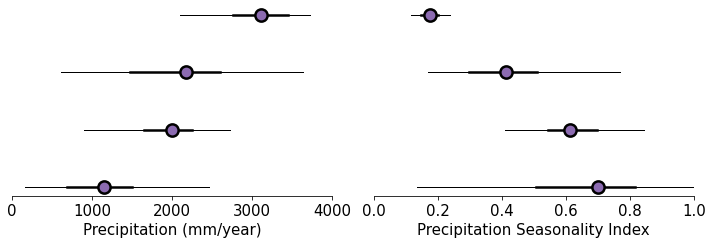

In [49]:
fig, ax = plt.subplots(1,2, figsize=(10,3.5))
dataframe_forest = forest_dataframe(lat_min,lat_max,lon_min,lon_max)
dataframe_sav = savanna_dataframe(lat_min,lat_max,lon_min,lon_max)
for i,var in zip([0,1], ['Precip', 'Seasonality']):
    boxplot_custom(3, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] <= Sr_lower_threshold).dropna()), ax = ax[i])
    boxplot_custom(2, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] > Sr_lower_threshold) & (dataframe_forest['Sr'] < Sr_upper_threshold)).dropna()), ax = ax[i])
    boxplot_custom(1, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] >= Sr_upper_threshold) & (dataframe_forest['Sr'] < Sr_emp_99th_perc)).dropna()), ax = ax[i])
    boxplot_custom(0, pd.DataFrame(dataframe_sav[str(var)]), ax = ax[i])

ax[0].set_xlim(0,4000)
ax[1].set_xlim(0,1)
ax[0].set_xlabel('Precipitation (mm/year)', fontsize = 15)
ax[1].set_xlabel('Precipitation Seasonality Index', fontsize = 15)
plt.tight_layout()

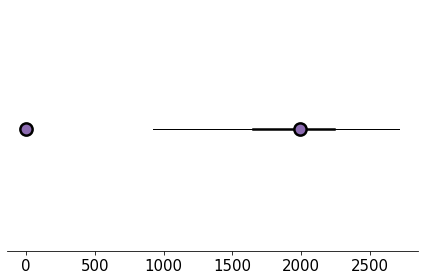

In [50]:
Precip_025,Precip_25,Precip_75,Precip_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Precip'].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()))
Seasonality_025,Seasonality_25,Seasonality_75,Seasonality_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Seasonality'].where(dataframe_forest['Sr'] >= Sr_upper_threshold).dropna()))

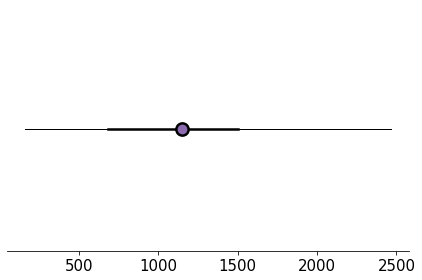

In [51]:
_,_,sav_Precip_75,_ = boxplot_custom(1, pd.DataFrame(dataframe_sav['Precip'].dropna()))

In [52]:
Prec_percentile_025 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_025).abs().idxmin()]['Precip_percentile']
Prec_percentile_25 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_25).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_025 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_025).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_975 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_975).abs().idxmin()]['Seasonality_percentile']

In [53]:
sav_Prec_percentile_75 = dataframe_forest.loc[dataframe_forest['Precip'].sub(sav_Precip_75).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_25 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_25).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_75 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_75).abs().idxmin()]['Seasonality_percentile']

In [54]:
Sr_sel = Sr.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)

------------

In [55]:
CMIP6_class_all = {}

for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                          lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else:
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max),
                                                                                                                                          lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()

        """
        ### Saving rootzone storage capacity change as classes 1-9 (forest-savanna tansitions not included)
        """
        CMIP6_Sr_class = {}
        CMIP6_Sr_class['1'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['2'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['3'] = Sr_sel.where((Sr_sel.values <= Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['4'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['5'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['6'] = Sr_sel.where((Sr_sel > Sr_lower_threshold) & (Sr_sel <= Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['7'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (Sr_sel <= Sr_emp_99th_perc) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['8'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (Sr_sel <= Sr_emp_99th_perc) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['9'] = Sr_sel.where((Sr_sel > Sr_upper_threshold) & (Sr_sel <= Sr_emp_99th_perc) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        #CMIP6_Sr_class['10'] = Sr_sel.where((Sr_sel > Sr_emp_99th_perc) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,11]))
        CMIP6_Sr_class['10'] = Sr_sel.where((CMIP6_Sr_interp_future.values > a_temp.iloc[i,11]))
        
        """
        fig = plt.figure(figsize=(10,4), dpi = 200)
        ax = [plt.subplot(121,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(122,projection=ccrs.PlateCarree(), aspect='auto'),]

        Sr_sel.where(Sr_sel > Sr_emp_99th_perc).plot(ax = ax[0])
        CMIP6_Sr_interp_future.where(CMIP6_Sr_interp_future > a_temp.iloc[i,11]).plot(ax = ax[1])
        for j in range(2):
            ax[j].coastlines(lw = 1.2)
            ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
            fig.patch.set_visible(False)
            ax[j].axis('off')
            ax[j].set_xlim(-83,-34)
            ax[j].set_ylim(-33,13)
        plt.show()
        """
        
        for class_number in range(1,11):
            CMIP6_Sr_class[str(class_number)] = (CMIP6_Sr_class[str(class_number)].fillna(0)/CMIP6_Sr_class[str(class_number)].fillna(0))*class_number
        
        CMIP6_Sr_class = (CMIP6_Sr_class['1'].fillna(0)+CMIP6_Sr_class['2'].fillna(0)+CMIP6_Sr_class['3'].fillna(0)+CMIP6_Sr_class['4'].fillna(0)+CMIP6_Sr_class['5'].fillna(0)+CMIP6_Sr_class['6'].fillna(0)+
                          CMIP6_Sr_class['7'].fillna(0)+CMIP6_Sr_class['8'].fillna(0)+CMIP6_Sr_class['9'].fillna(0)+CMIP6_Sr_class['10'].fillna(0))
        CMIP6_Sr_class = CMIP6_Sr_class.where(CMIP6_Sr_class > 0)
        CMIP6_Sr_class.values = (np.where(CMIP6_Sr_class >= 10, 10, CMIP6_Sr_class))
        CMIP6_class_all[SSP+'.'+str(a_temp.iloc[i,1])] = CMIP6_Sr_class

100%|██████████| 30/30 [00:02<00:00, 11.47it/s]


In [56]:
#Interesting trends-4,5,15,22

SA_CMIP6_class_all_forest_savanna_corrected = {}
for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        CMIP6_Sr_class = CMIP6_class_all[SSP+'.'+a_temp.iloc[i,1]]
        # -----------
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), 
                                                                                                              lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        CMIP6_prec_historical = 0
        CMIP6_prec_historical = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(historical_year_start),str(historical_year_end))).pr[0]
        CMIP6_prec_yearly_historical = CMIP6_prec_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_prec_historical.shape[1],CMIP6_prec_historical.shape[2])
        CMIP6_prec_monthly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time'))
        CMIP6_prec_yearly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        CMIP6_prec_monthly_historical_mean = CMIP6_prec_monthly_historical_mean.values

        CMIP6_evap_historical = 0
        CMIP6_evap_historical = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(historical_year_start),str(historical_year_end))).evspsbl[0]
        CMIP6_evap_yearly_historical = CMIP6_evap_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_evap_historical.shape[1],CMIP6_evap_historical.shape[2])
        CMIP6_evap_yearly_historical_mean = (CMIP6_evap_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        ####

        ####    
        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
                future_year_end = 2098
            else:
                future_year_end = 2099
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max),
                                                                                                                                              lon = slice(lon_min,lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()


        CMIP6_prec_future = 0
        CMIP6_prec_future = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(future_year_start),str(future_year_end))).pr[0]
        CMIP6_prec_monthly_future = CMIP6_prec_future*sum_of_day(future_year_start,future_year_end,CMIP6_prec_future.shape[1],CMIP6_prec_future.shape[2])
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future.groupby('time.month').mean('time')
        CMIP6_prec_yearly_future_mean = CMIP6_prec_monthly_future_mean.sum(axis = 0)
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future_mean.values

        CMIP6_evap_future = 0
        CMIP6_evap_future = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max), time = slice(str(future_year_start),str(future_year_end))).evspsbl[0]
        CMIP6_evap_yearly_future = CMIP6_evap_future*sum_of_day(future_year_start,future_year_end,CMIP6_evap_future.shape[1],CMIP6_evap_future.shape[2])
        CMIP6_evap_yearly_future_mean = CMIP6_evap_yearly_future.groupby('time.month').mean('time').sum(axis = 0)
        ####

        Seasonality_historical = calc_Seasonality(CMIP6_prec_monthly_historical_mean)
        Seasonality_future = calc_Seasonality(CMIP6_prec_monthly_future_mean)
        lat = CMIP6_prec_yearly_future_mean.lat.values
        lon = CMIP6_prec_yearly_future_mean.lon.values

        Prec_CHIRPS = xr.open_dataset(parent_dir+'Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sum(axis = 0).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)); Prec_CHIRPS = Prec_CHIRPS.where(Prec_CHIRPS>0)
        #MeanTC_sel = (xr.open_dataset('/home/jovyan/PlanetaryComputerExamples/Paper3/Treecover_MOD44B_2001-2012.nc').treecover.mean(axis = 0)).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
        Seasonality_historical = interp_selfilter(Seasonality_historical, Landuse,lat_min, lat_max, lon_min, lon_max) 
        Seasonality_future = interp_selfilter(Seasonality_future, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_prec_yearly_historical_mean = interp_selfilter(CMIP6_prec_yearly_historical_mean, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_prec_yearly_future_mean = interp_selfilter(CMIP6_prec_yearly_future_mean, Landuse,lat_min, lat_max, lon_min, lon_max)

        CMIP6_evap_yearly_historical_mean = interp_selfilter(CMIP6_evap_yearly_historical_mean, Landuse,lat_min, lat_max, lon_min, lon_max)
        CMIP6_evap_yearly_future_mean = interp_selfilter(CMIP6_evap_yearly_future_mean, Landuse,lat_min, lat_max, lon_min, lon_max)

        dataframe_variables = 0
        dataframe_variables = pd.concat([pd.DataFrame({'Precip_Observed': Prec_CHIRPS.values.flatten()}),
                               pd.DataFrame({'Landuse': Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values.flatten()}),
                               pd.DataFrame({'Precip_CMIP_hist': CMIP6_prec_yearly_historical_mean.values.flatten()}),
                               pd.DataFrame({'Seasonality_CMIP_hist': Seasonality_historical.values.flatten()})], axis = 1).dropna()


        dataframe_variables = remove_outliers(dataframe_variables, 'Precip_CMIP_hist')
        dataframe_variables = remove_outliers(dataframe_variables, 'Seasonality_CMIP_hist')
        sz = dataframe_variables['Precip_CMIP_hist'].size-1
        dataframe_variables['Precip_percentile'] = dataframe_variables['Precip_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
        dataframe_variables['Seasonality_percentile'] = dataframe_variables['Seasonality_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)  

        Prec_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_025).abs().idxmin()]['Precip_CMIP_hist']
        Prec_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_25).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_025).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_975_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_975).abs().idxmin()]['Seasonality_CMIP_hist']   

        sav_Prec_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(sav_Prec_percentile_75).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_25).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_75).abs().idxmin()]['Seasonality_CMIP_hist']   
        #----------------------------------------------------------
        a = 0
        a = (Forest_savanna_transition(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        SA_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+str(a_temp.iloc[i,1])] = a
        future_year_end = 2100

100%|██████████| 30/30 [02:30<00:00,  5.01s/it]


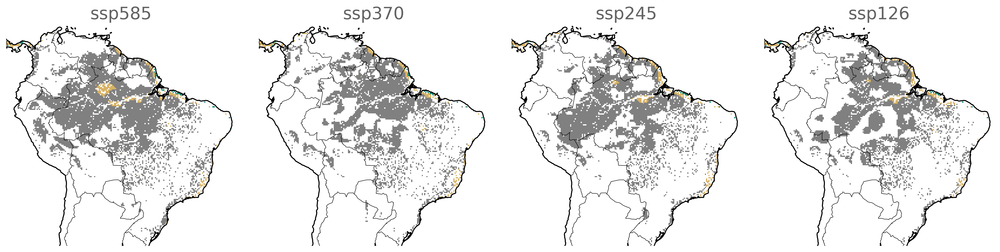

In [57]:
fig = plt.figure(figsize=(20,4.5), dpi = 300)
ax = [plt.subplot(141,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(142,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(143,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(144,projection=ccrs.PlateCarree(), aspect='auto')]

j = 0
for i in ['ssp585','ssp370','ssp245','ssp126']:
    combined_classification_all_WSf_future_custom(i, SA_CMIP6_class_all_forest_savanna_corrected, 10,10,10).plot(ax = ax[j],
                                                                                    vmin = 0, vmax = 1, levels = [0,0.2, 0.50,1], 
                                                                                            add_colorbar=False, colors = ['grey','#d8b365','#018571'])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,-34)
    ax[j].set_ylim(-33,13)
    ax[j].set_title(i, fontsize = '20', color = '#636363');
    j = j+1
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=0.1)

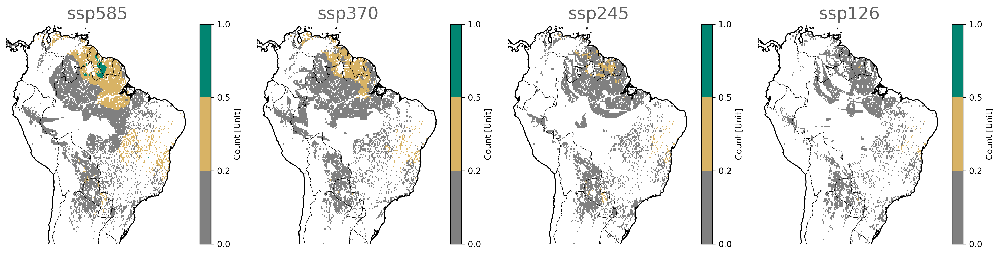

In [58]:
fig = plt.figure(figsize=(20,4.5), dpi = 300)
ax = [plt.subplot(141,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(142,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(143,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(144,projection=ccrs.PlateCarree(), aspect='auto')]

j = 0
for i in ['ssp585','ssp370','ssp245','ssp126']:
    combined_classification_all_WSf_future_custom(i, SA_CMIP6_class_all_forest_savanna_corrected, 11,12,13).plot(ax = ax[j],
                                                                                    vmin = 0, vmax = 1, levels = [0,0.2, 0.50,1], 
                                                                                            add_colorbar=True, colors = ['grey','#d8b365','#018571'])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,-34)
    ax[j].set_ylim(-33,13)
    ax[j].set_title(i, fontsize = '20', color = '#636363');
    j = j+1
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=0.1)

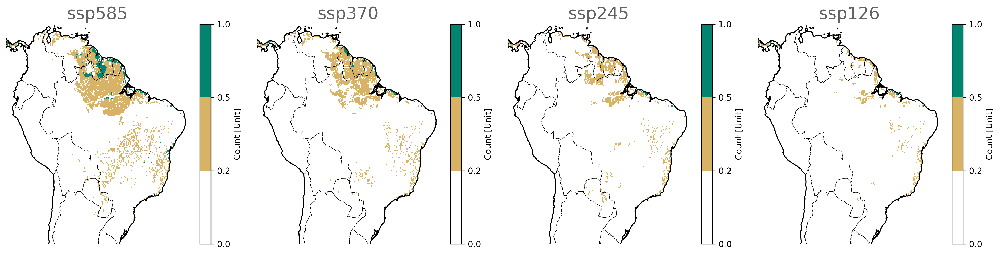

In [59]:
fig = plt.figure(figsize=(20,4.5), dpi = 300)
ax = [plt.subplot(141,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(142,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(143,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(144,projection=ccrs.PlateCarree(), aspect='auto')]

j = 0
for i in ['ssp585','ssp370','ssp245','ssp126']:
    combined_classification_all_WSf_future_custom_4(i, SA_CMIP6_class_all_forest_savanna_corrected, 10,11,12,13).plot(ax = ax[j],
                                                                                    vmin = 0, vmax = 1, levels = [0,0.2, 0.50,1], 
                                                                                            add_colorbar=True, colors = ['white','#d8b365','#018571'])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,-34)
    ax[j].set_ylim(-33,13)
    ax[j].set_title(i, fontsize = '20', color = '#636363');
    j = j+1
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=0.1)

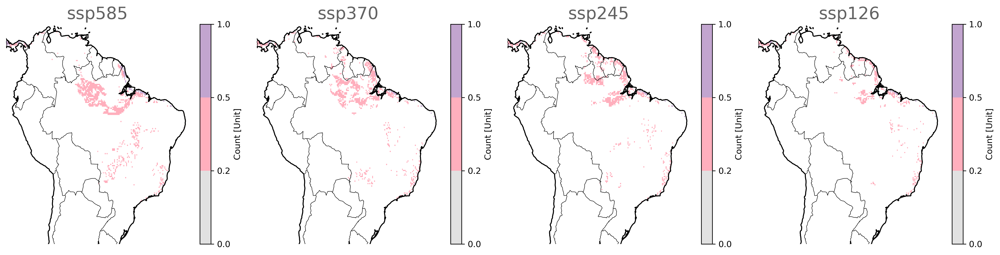

In [76]:
fig = plt.figure(figsize=(20,4.5), dpi = 300)
ax = [plt.subplot(141,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(142,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(143,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(144,projection=ccrs.PlateCarree(), aspect='auto')]
colors = ['#e1e1e1','#ffafbd','#c2a5cf']

j = 0
for i in ['ssp585','ssp370','ssp245','ssp126']:
    t_1 = combined_classification_all_WSf_future_custom(i, SA_CMIP6_class_all_forest_savanna_corrected, 11,12,13)
    t_1 = t_1.where(t_1 > 0.2)
    t_1 = t_1/t_1
    #t_1 = np.where(t_1.values >= 0, np.nan, 1)
    t_2 = combined_classification_all_WSf_future_custom_4(i, SA_CMIP6_class_all_forest_savanna_corrected, 10,11,12,13)
    t_2 = t_2.where(t_2 > 0.2)
    #t_2 = t_2/t_2
    t_2 = t_2.where(np.where(t_1.values >= 0, np.nan, 1) > 0)
    t_2.plot(ax = ax[j], add_colorbar=True, colors = colors, levels = [0,0.2, 0.50,1])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,-34)
    ax[j].set_ylim(-33,13)
    ax[j].set_title(i, fontsize = '20', color = '#636363');
    j = j+1
    t_2.to_netcdf(parent_dir_sensitivity+'Dataexport_validation/SA_'+str(i)+'_tipping_SF18.nc')
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=0.1)

In [25]:
# For Africa
AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max = [-35,15,0,55]
if (AF_lon_min == 0) & (AF_lon_max == 55):
    Country = 'Africa'
else:
    Country = 'Check country'

Africa (Total Area) = 5611461.72376163 km^2

In [26]:
df_final = pd.read_csv(parent_dir_sensitivity+'/'+str(Sensitivity_id)+'_CMIP6-Future_models_all_(with Sr-eq)_Africa.csv')

In [27]:
df_final

,institution_id,source_id,table_id,grid_label,historical,ssp126,ssp245,ssp370,ssp585,Sr-100eq,Sr-350eq,Sr-99th_perc_eq
0,CSIRO-ARCCSS,ACCESS-CM2,Amon,gn,1,1,1,1,1,119.123553,311.524065,474.564049
1,CSIRO,ACCESS-ESM1-5,Amon,gn,1,1,0,0,1,204.205537,294.046580,386.826745
2,AWI,AWI-CM-1-1-MR,Amon,gn,1,1,1,1,1,130.238946,354.002749,706.527798
3,BCC,BCC-CSM2-MR,Amon,gn,1,1,1,1,1,66.485056,134.693508,263.254286
4,CAS,CAS-ESM2-0,Amon,gn,1,1,1,1,1,44.669050,220.224234,464.993782
5,NCAR,CESM2-WACCM,Amon,gn,1,1,1,1,1,125.933261,313.065508,580.254010
6,CMCC,CMCC-CM2-SR5,Amon,gn,1,1,1,1,1,106.792368,203.101331,320.559706
7,CMCC,CMCC-ESM2,Amon,gn,1,1,1,1,1,121.758314,203.189757,328.030778
8,CCCma,CanESM5,Amon,gn,1,1,1,1,1,256.100396,425.065006,567.017129
9,E3SM-Project,E3SM-1-1,Amon,gr,1,0,0,0,1,109.404332,219.301242,388.722883


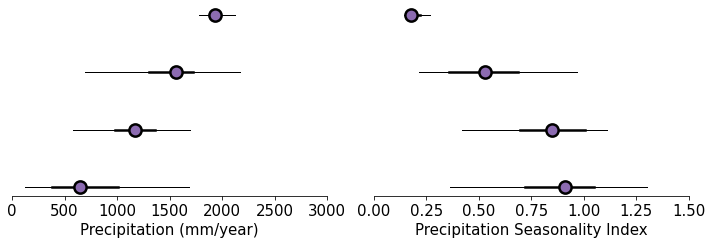

In [28]:
fig, ax = plt.subplots(1,2, figsize=(10,3.5))
dataframe_forest = forest_dataframe(AF_lat_min,AF_lat_max,AF_lon_min,AF_lon_max)
dataframe_sav = savanna_dataframe(AF_lat_min,AF_lat_max,AF_lon_min,AF_lon_max)
for i,var in zip([0,1], ['Precip', 'Seasonality']):
    boxplot_custom(3, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] <= AF_Sr_lower_threshold).dropna()), ax = ax[i])
    boxplot_custom(2, pd.DataFrame(dataframe_forest[str(var)].where((dataframe_forest['Sr'] > AF_Sr_lower_threshold) & (dataframe_forest['Sr'] < AF_Sr_upper_threshold)).dropna()), ax = ax[i])
    boxplot_custom(1, pd.DataFrame(dataframe_forest[str(var)].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()), ax = ax[i])
    boxplot_custom(0, pd.DataFrame(dataframe_sav[str(var)]), ax = ax[i])

ax[0].set_xlim(0,3000)
ax[1].set_xlim(0,1.5)
ax[0].set_xlabel('Precipitation (mm/year)', fontsize = 15)
ax[1].set_xlabel('Precipitation Seasonality Index', fontsize = 15)
plt.tight_layout()

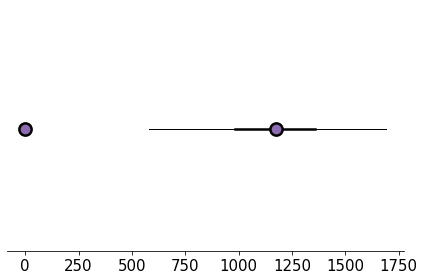

In [29]:
Precip_025,Precip_25,Precip_75,Precip_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Precip'].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()))
Seasonality_025,Seasonality_25,Seasonality_75,Seasonality_975 = boxplot_custom(1, pd.DataFrame(dataframe_forest['Seasonality'].where(dataframe_forest['Sr'] >= AF_Sr_upper_threshold).dropna()))

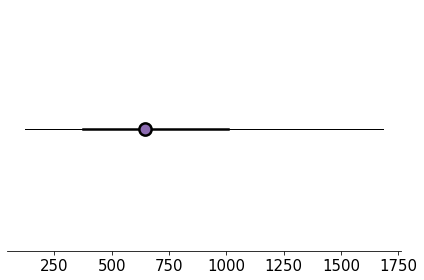

In [30]:
_,_,sav_Precip_75,_ = boxplot_custom(1, pd.DataFrame(dataframe_sav['Precip'].dropna()))

In [31]:
Prec_percentile_025 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_025).abs().idxmin()]['Precip_percentile']
Prec_percentile_25 = dataframe_forest.loc[dataframe_forest['Precip'].sub(Precip_25).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_025 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_025).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_975 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_975).abs().idxmin()]['Seasonality_percentile']

In [32]:
sav_Prec_percentile_75 = dataframe_forest.loc[dataframe_forest['Precip'].sub(sav_Precip_75).abs().idxmin()]['Precip_percentile']

Seasonality_percentile_25 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_25).abs().idxmin()]['Seasonality_percentile']
Seasonality_percentile_75 = dataframe_forest.loc[dataframe_forest['Seasonality'].sub(Seasonality_75).abs().idxmin()]['Seasonality_percentile']

In [33]:
Sr_sel = Sr.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values > 0)

---

In [34]:
CMIP6_class_all = {}

for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), 
                                                                                                          lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
            else:
                CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        else:
            CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max),
                                                                                                                                          lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()

        """
        ### Saving rootzone storage capacity change as classes 1-9 (forest-savanna tansitions not included)
        """
        CMIP6_Sr_class = {}
        CMIP6_Sr_class['1'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['2'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['3'] = Sr_sel.where((Sr_sel.values <= AF_Sr_lower_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['4'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['5'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['6'] = Sr_sel.where((Sr_sel > AF_Sr_lower_threshold) & (Sr_sel <= AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['7'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,9]))
        CMIP6_Sr_class['8'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,9]) & (CMIP6_Sr_interp_future.values <= a_temp.iloc[i,10]))
        CMIP6_Sr_class['9'] = Sr_sel.where((Sr_sel > AF_Sr_upper_threshold) & (CMIP6_Sr_interp_future.values > a_temp.iloc[i,10]))
        CMIP6_Sr_class['10'] = Sr_sel.where((CMIP6_Sr_interp_future.values > a_temp.iloc[i,11]))       
        
        for class_number in range(1,11):
            CMIP6_Sr_class[str(class_number)] = (CMIP6_Sr_class[str(class_number)].fillna(0)/CMIP6_Sr_class[str(class_number)].fillna(0))*class_number
        
        CMIP6_Sr_class = (CMIP6_Sr_class['1'].fillna(0)+CMIP6_Sr_class['2'].fillna(0)+CMIP6_Sr_class['3'].fillna(0)+CMIP6_Sr_class['4'].fillna(0)+CMIP6_Sr_class['5'].fillna(0)+CMIP6_Sr_class['6'].fillna(0)+
                          CMIP6_Sr_class['7'].fillna(0)+CMIP6_Sr_class['8'].fillna(0)+CMIP6_Sr_class['9'].fillna(0)+CMIP6_Sr_class['10'].fillna(0))
        CMIP6_Sr_class = CMIP6_Sr_class.where(CMIP6_Sr_class > 0)
        CMIP6_Sr_class.values = (np.where(CMIP6_Sr_class >= 10, 10, CMIP6_Sr_class))
        CMIP6_class_all[SSP+'.'+str(a_temp.iloc[i,1])] = CMIP6_Sr_class

100%|██████████| 30/30 [00:02<00:00, 12.38it/s]


In [36]:
#Interesting trends-4,5,15,22

AF_CMIP6_class_all_forest_savanna_corrected = {}
for SSP in ['ssp126','ssp245','ssp370','ssp585']:
    a_temp = df_final.where(df_final[SSP] == 1).dropna()
    for i in tqdm(range(a_temp.shape[0])):
        CMIP6_Sr_class = CMIP6_class_all[SSP+'.'+a_temp.iloc[i,1]]
        # -----------
        os.chdir(parent_dir+'/Sr_estimates/historical/')
        temp_name = 'CMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+'historical'+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        CMIP6_Sr_interp_historical = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.2000-2014.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_historical = CMIP6_Sr_interp_historical.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), 
                                                                                                              lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_historical.close()

        CMIP6_prec_historical = 0
        CMIP6_prec_historical = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(historical_year_start),str(historical_year_end))).pr[0]
        CMIP6_prec_yearly_historical = CMIP6_prec_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_prec_historical.shape[1],CMIP6_prec_historical.shape[2])
        CMIP6_prec_monthly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time'))
        CMIP6_prec_yearly_historical_mean = (CMIP6_prec_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        CMIP6_prec_monthly_historical_mean = CMIP6_prec_monthly_historical_mean.values

        CMIP6_evap_historical = 0
        CMIP6_evap_historical = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(historical_year_start),str(historical_year_end))).evspsbl[0]
        CMIP6_evap_yearly_historical = CMIP6_evap_historical*sum_of_day(historical_year_start,historical_year_end,CMIP6_evap_historical.shape[1],CMIP6_evap_historical.shape[2])
        CMIP6_evap_yearly_historical_mean = (CMIP6_evap_yearly_historical.groupby('time.month').mean('time')).sum(axis = 0)
        ####

        ####    
        os.chdir(parent_dir+'/Sr_estimates/'+SSP+'/')
        temp_name = 'ScenarioMIP.'+a_temp.iloc[i,0]+'.'+a_temp.iloc[i,1]+'.'+SSP+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'MPI-ESM1-2-HR'):
            temp_name = 'ScenarioMIP.'+'DKRZ'+'.'+a_temp.iloc[i,1]+'.'+str(SSP)+'.'+a_temp.iloc[i,2]+'.'+a_temp.iloc[i,3]
        if (a_temp.iloc[i,1] == 'IITM-ESM'):
            if (SSP == 'ssp370'):
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2098)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
                future_year_end = 2098
            else:
                future_year_end = 2099
                #CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(2099)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = xr.open_dataset('Sr-20year-return-period'+'.'+temp_name+'.'+str(future_year_start)+'-'+str(future_year_end)+'.nc').Sr.interp(lat=new_lat, lon=new_lon)
        CMIP6_Sr_interp_future = CMIP6_Sr_interp_future.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).where(Landuse.sel(lat = slice(AF_lat_min,AF_lat_max),
                                                                                                                                              lon = slice(AF_lon_min,AF_lon_max)).values > 0)
        CMIP6_Sr_interp_future.close()


        CMIP6_prec_future = 0
        CMIP6_prec_future = (CMIP6_datasets['pr'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(future_year_start),str(future_year_end))).pr[0]
        CMIP6_prec_monthly_future = CMIP6_prec_future*sum_of_day(future_year_start,future_year_end,CMIP6_prec_future.shape[1],CMIP6_prec_future.shape[2])
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future.groupby('time.month').mean('time')
        CMIP6_prec_yearly_future_mean = CMIP6_prec_monthly_future_mean.sum(axis = 0)
        CMIP6_prec_monthly_future_mean = CMIP6_prec_monthly_future_mean.values

        CMIP6_evap_future = 0
        CMIP6_evap_future = (CMIP6_datasets['evspsbl'][temp_name]).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max), time = slice(str(future_year_start),str(future_year_end))).evspsbl[0]
        CMIP6_evap_yearly_future = CMIP6_evap_future*sum_of_day(future_year_start,future_year_end,CMIP6_evap_future.shape[1],CMIP6_evap_future.shape[2])
        CMIP6_evap_yearly_future_mean = CMIP6_evap_yearly_future.groupby('time.month').mean('time').sum(axis = 0)
        ####

        Seasonality_historical = calc_Seasonality(CMIP6_prec_monthly_historical_mean)
        Seasonality_future = calc_Seasonality(CMIP6_prec_monthly_future_mean)
        lat = CMIP6_prec_yearly_future_mean.lat.values
        lon = CMIP6_prec_yearly_future_mean.lon.values

        Prec_CHIRPS = xr.open_dataset(parent_dir+'/Empirical_data/chirps-v2.0.2000-2012.meanmonthly_p25.nc').precip.sum(axis = 0).sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)); Prec_CHIRPS = Prec_CHIRPS.where(Prec_CHIRPS>0)
        #MeanTC_sel = (xr.open_dataset('/home/jovyan/PlanetaryComputerExamples/Paper3/Treecover_MOD44B_2001-2012.nc').treecover.mean(axis = 0)).sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))
        Seasonality_historical = interp_selfilter(Seasonality_historical, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max) 
        Seasonality_future = interp_selfilter(Seasonality_future, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_prec_yearly_historical_mean = interp_selfilter(CMIP6_prec_yearly_historical_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_prec_yearly_future_mean = interp_selfilter(CMIP6_prec_yearly_future_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)

        CMIP6_evap_yearly_historical_mean = interp_selfilter(CMIP6_evap_yearly_historical_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)
        CMIP6_evap_yearly_future_mean = interp_selfilter(CMIP6_evap_yearly_future_mean, Landuse,AF_lat_min, AF_lat_max, AF_lon_min, AF_lon_max)

        dataframe_variables = 0
        dataframe_variables = pd.concat([pd.DataFrame({'Precip_Observed': Prec_CHIRPS.values.flatten()}),
                               pd.DataFrame({'Landuse': Landuse.sel(lat = slice(AF_lat_min,AF_lat_max), lon = slice(AF_lon_min,AF_lon_max)).values.flatten()}),
                               pd.DataFrame({'Precip_CMIP_hist': CMIP6_prec_yearly_historical_mean.values.flatten()}),
                               pd.DataFrame({'Seasonality_CMIP_hist': Seasonality_historical.values.flatten()})], axis = 1).dropna()


        dataframe_variables = remove_outliers(dataframe_variables, 'Precip_CMIP_hist')
        dataframe_variables = remove_outliers(dataframe_variables, 'Seasonality_CMIP_hist')
        sz = dataframe_variables['Precip_CMIP_hist'].size-1
        dataframe_variables['Precip_percentile'] = dataframe_variables['Precip_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)    
        dataframe_variables['Seasonality_percentile'] = dataframe_variables['Seasonality_CMIP_hist'].rank(method='max').apply(lambda x: 100.0*(x-1)/sz)  

        Prec_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_025).abs().idxmin()]['Precip_CMIP_hist']
        Prec_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(Prec_percentile_25).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_025_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_025).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_975_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_975).abs().idxmin()]['Seasonality_CMIP_hist']   

        sav_Prec_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Precip_percentile'].sub(sav_Prec_percentile_75).abs().idxmin()]['Precip_CMIP_hist']
        Seasonality_25_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_25).abs().idxmin()]['Seasonality_CMIP_hist']
        Seasonality_75_percentile_eq = dataframe_variables.loc[dataframe_variables['Seasonality_percentile'].sub(Seasonality_percentile_75).abs().idxmin()]['Seasonality_CMIP_hist']   
        #----------------------------------------------------------
        a = 0
        a = (Forest_savanna_transition(CMIP6_Sr_class.values, CMIP6_prec_yearly_historical_mean, Seasonality_historical, 
                                       CMIP6_prec_yearly_future_mean, Seasonality_future))
        AF_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+str(a_temp.iloc[i,1])] = a
        future_year_end = 2100

100%|██████████| 30/30 [02:04<00:00,  4.14s/it]


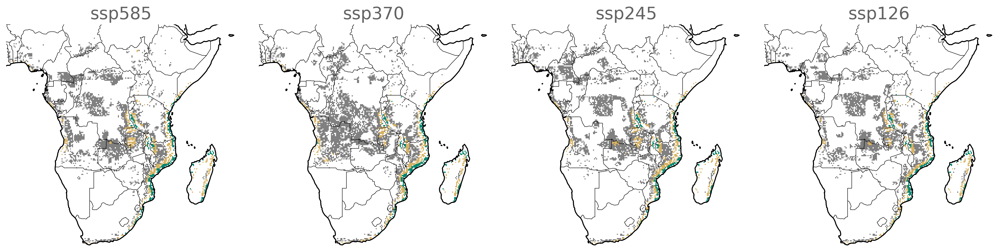

In [37]:
fig = plt.figure(figsize=(20,4.5), dpi = 300)
ax = [plt.subplot(141,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(142,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(143,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(144,projection=ccrs.PlateCarree(), aspect='auto')]

j = 0
for i in ['ssp585','ssp370','ssp245','ssp126']:
    combined_classification_all_WSf_future_custom(i, AF_CMIP6_class_all_forest_savanna_corrected, 10,10,10).plot(ax = ax[j],
                                                                                    vmin = 0, vmax = 1, levels = [0,0.2, 0.50,1], 
                                                                                            add_colorbar=False, colors = ['grey','#d8b365','#018571'])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    #ax[j].set_xlim(-83,-34)
    #ax[j].set_ylim(-33,13)
    ax[j].set_title(i, fontsize = '20', color = '#636363');
    j = j+1
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=0.1)

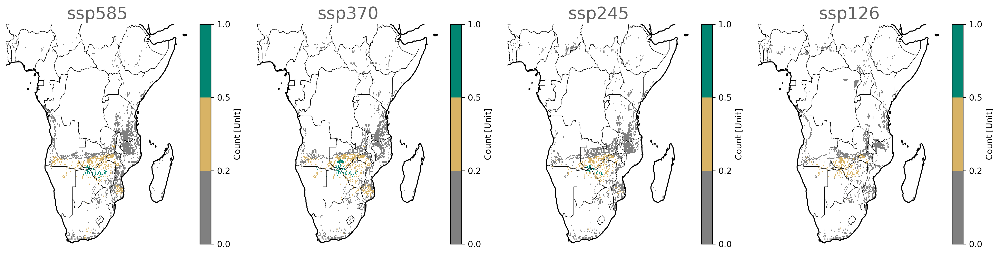

In [38]:
fig = plt.figure(figsize=(20,4.5), dpi = 300)
ax = [plt.subplot(141,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(142,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(143,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(144,projection=ccrs.PlateCarree(), aspect='auto')]

j = 0
for i in ['ssp585','ssp370','ssp245','ssp126']:
    combined_classification_all_WSf_future_custom(i, AF_CMIP6_class_all_forest_savanna_corrected, 11,12,13).plot(ax = ax[j],
                                                                                    vmin = 0, vmax = 1, levels = [0,0.2, 0.50,1], 
                                                                                            add_colorbar=True, colors = ['grey','#d8b365','#018571'])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    #ax[j].set_xlim(-83,-34)
    #ax[j].set_ylim(-33,13)
    ax[j].set_title(i, fontsize = '20', color = '#636363');
    j = j+1
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=0.1)

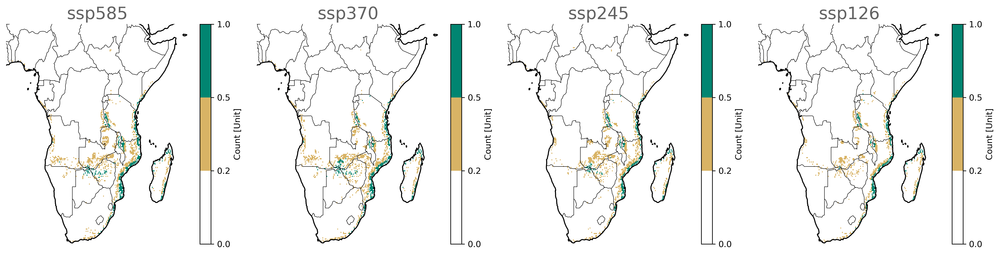

In [39]:
fig = plt.figure(figsize=(20,4.5), dpi = 300)
ax = [plt.subplot(141,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(142,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(143,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(144,projection=ccrs.PlateCarree(), aspect='auto')]

j = 0
for i in ['ssp585','ssp370','ssp245','ssp126']:
    combined_classification_all_WSf_future_custom_4(i, AF_CMIP6_class_all_forest_savanna_corrected, 10,11,12,13).plot(ax = ax[j],
                                                                                    vmin = 0, vmax = 1, levels = [0,0.2, 0.50,1], 
                                                                                            add_colorbar=True, colors = ['white','#d8b365','#018571'])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    #ax[j].set_xlim(-83,-34)
    #ax[j].set_ylim(-33,13)
    ax[j].set_title(i, fontsize = '20', color = '#636363');
    j = j+1
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=0.1)

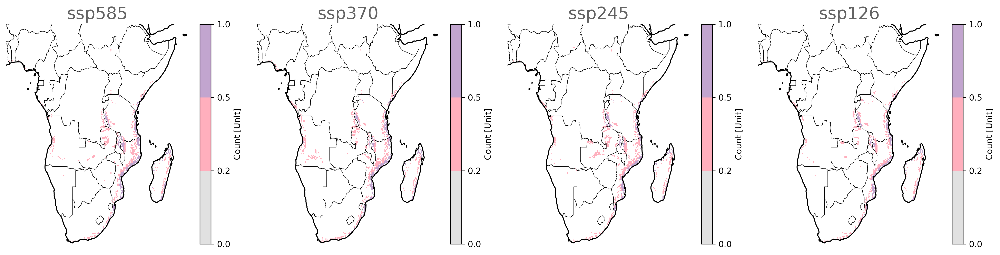

In [41]:
fig = plt.figure(figsize=(20,4.5), dpi = 300)
ax = [plt.subplot(141,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(142,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(143,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(144,projection=ccrs.PlateCarree(), aspect='auto')]

j = 0
for i in ['ssp585','ssp370','ssp245','ssp126']:
    t_1 = combined_classification_all_WSf_future_custom(i, AF_CMIP6_class_all_forest_savanna_corrected, 11,12,13)
    t_1 = t_1.where(t_1 > 0.2)
    t_1 = t_1/t_1
    #t_1 = np.where(t_1.values >= 0, np.nan, 1)
    t_2 = combined_classification_all_WSf_future_custom_4(i, AF_CMIP6_class_all_forest_savanna_corrected, 10,11,12,13)
    t_2 = t_2.where(t_2 > 0.2)
    #t_2 = t_2/t_2
    t_2 = t_2.where(np.where(t_1.values >= 0, np.nan, 1) > 0)
    t_2.plot(ax = ax[j], add_colorbar=True, colors = colors, levels = [0,0.2, 0.50,1])
    ax[j].coastlines(lw = 1.2)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5)
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_title(i, fontsize = '20', color = '#636363');
    j = j+1
    t_2.to_netcdf(parent_dir_sensitivity+'Dataexport_validation/AF_'+str(i)+'_tipping_SF18.nc')
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.1, hspace=0.1)

In [4]:
parent_dir_sensitivity

'/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/Sensitivity/'

In [21]:
ax[0]

<GeoAxesSubplot:xlabel='lon', ylabel='lat'>

Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)
Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)
Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


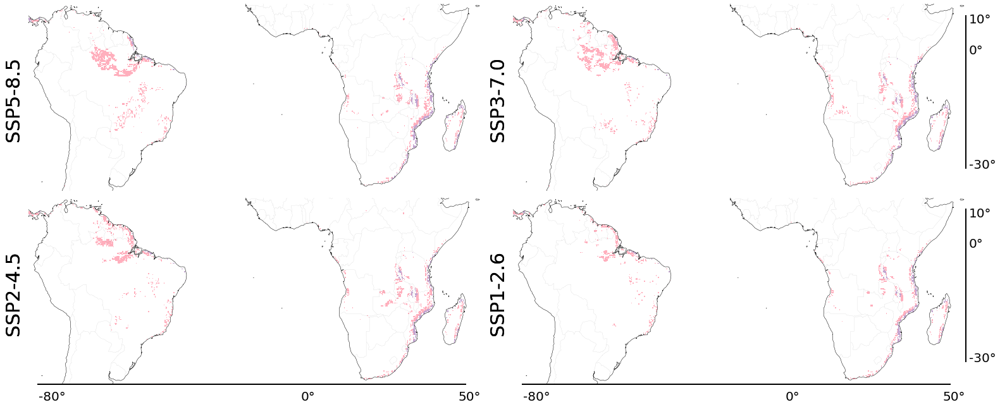

In [23]:
fig = plt.figure(figsize=(22,9))
ax = [plt.subplot(221,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(222,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(223,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(224,projection=ccrs.PlateCarree(), aspect='auto')]

colors = ['#e1e1e1','#ffafbd','#c2a5cf']

i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -22, SSP_name, ha='center', fontsize = 30, color = 'black', zorder = 1000, rotation  = 90);
    xr.open_dataset(parent_dir_sensitivity+'Dataexport_validation/SA_'+SSP+'_tipping_SF18.nc').Count.plot(add_colorbar=False, 
colors = colors, levels = [0,0.2, 0.50,1], ax = ax[i])
    i = i+1

    
i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -22, SSP_name, ha='center', fontsize = 30, color = 'black', zorder = 1000, rotation  = 90);
    xr.open_dataset(parent_dir_sensitivity+'Dataexport_validation/AF_'+SSP+'_tipping_SF18.nc').Count.plot(add_colorbar=False, 
colors = colors, levels = [0,0.2, 0.50,1], ax = ax[i])
    i = i+1
    
for j in range(4):
    ax[j].coastlines(lw = 0.5)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.1, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)
    
for i in [1,3]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '20')
    ax[i].text(56, 8,'10°', fontsize = '20')
    ax[i].text(56, -30,'-30°', fontsize = '20')

for i in [2,3]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 4)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '20')
    ax[i].text(0,-40,'0°', fontsize = '20')
    ax[i].text(48,-40,'50°', fontsize = '20')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.15, hspace=0.1)

plt.tight_layout()

fig.savefig(parent_dir+'/Figures/Supplementary_Fig17_partA.tif', dpi=300, bbox_inches="tight")

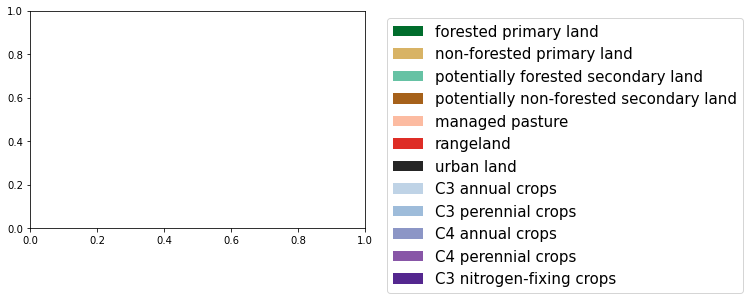

In [24]:
## Plotting ecoregion legend
color = ['#006d2c', '#d8b365', '#66c2a4',
         '#a6611a', '#fcbba1', '#de2d26',
         '#252525', '#bfd3e6','#9ebcda',
         '#8c96c6','#8856a7','#54278f']
Ecozone_unique_name = ['forested primary land', 'non-forested primary land', 'potentially forested secondary land',
                       'potentially non-forested secondary land', 'managed pasture', 'rangeland',
                       'urban land', 'C3 annual crops', 'C3 perennial crops', 'C4 annual crops', 
                       'C4 perennial crops', 'C3 nitrogen-fixing crops']

import matplotlib.patches as mpatches
from matplotlib.font_manager import FontProperties

recs = []
for i in range(0,len(color)):
    recs.append(mpatches.Rectangle((0,0),1,1,fc=color[i]))
fontP = FontProperties()
fontP.set_size('15')
plt.legend(recs,Ecozone_unique_name, ncol = 1,prop=fontP, bbox_to_anchor=(2.15, 1))

In [31]:
def LUMIP_forest_transition_2300(SSP, Country, transition, ax=None, **kwargs):
    global dataframe_temp, Area
    columns=['primf','primn','secdf','secdn','pastr','range','urban','c3ann','c3per','c4ann','c4per','c3nfx']
    if Country == 'SA':
        lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
        Country_name = 'South America' 
    if Country == 'AF':
        lat_min, lat_max, lon_min, lon_max = [-35,15,0,55]
        Country_name = 'Africa'

    Area = xr.open_dataset(parent_dir+'/Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    data = xr.open_dataset(parent_dir_sensitivity+'/Dataexport_validation/'+Country+'_'+SSP+'_'+transition+'_SF18.nc').Count
    Area = Area.where(data.values > 0)
    
    color = ['#006d2c', '#d8b365', '#66c2a4',
             '#a6611a', '#fcbba1', '#de2d26',
             '#252525', '#bfd3e6','#9ebcda',
             '#8c96c6','#8856a7','#54278f']
    
    if (SSP == 'ssp585') | (SSP == 'ssp126'):
        LUMIP_2200 = []
        LUMIP_2300 = []
        for column in tqdm(columns):
            test_2 = xr.open_dataset(parent_dir+'/LUMIP_data/multiple-states_input4MIPs_landState_ScenarioMIP_'+SSP+'_2100-2300.nc', decode_times=False)
            test_2.coords['lon'] = (np.where((test_2.lon.values>0), (test_2.lon.values), (test_2.lon.values)+360))
            test_2 = test_2.sortby(test_2.lon); test_2 = test_2.sortby(test_2.lat)
            test_2200 = test_2[column][86:100]
            test_2200 = test_2200.median(axis = 0)
            test_2200 = test_2200.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
            test_2200 = test_2200.where(data.values > 0)
            test_2300 = test_2[column][186:200]
            test_2300 = test_2300.median(axis = 0)
            test_2300 = test_2300.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
            test_2300 = test_2300.where(data.values > 0)
            LUMIP_2200.append((Area*test_2200.values/1000000).sum().values)
            LUMIP_2300.append((Area*test_2300.values/1000000).sum().values)
        dataframe_temp = pd.DataFrame([columns])
        dataframe_temp.loc[0] = np.array(LUMIP_2200)
        dataframe_temp.loc[1] = np.array(LUMIP_2300)
        
        ax.bar([2200,2300], dataframe_temp[0], width = 50, color = color[0]);
        bottom = dataframe_temp[0];
        for i in range(1,12):
            ax.bar([2200,2300], dataframe_temp[i], width = 50, bottom = bottom, color = color[i])
            bottom = bottom + dataframe_temp[i]
            
    ax.set_ylim(0,Area.sum()/1000000)
    ax.tick_params(axis='x', labelrotation=90)
    ax.tick_params(axis='both', which='major', labelsize=14)
    #ax.set_ylabel(r'Area (10$^{6}$ km$^{2}$)', fontsize = '14')
    ax.set_yticks([])
    #ax.set_title(Country+'_'+SSP+'_'+transition)

In [32]:
def LUMIP_forest_transition_2015_2100(SSP, Country, transition, ax=None, **kwargs):
    columns=['primf','primn','secdf','secdn','pastr','range','urban','c3ann','c3per','c4ann','c4per','c3nfx']
    if Country == 'SA':
        lat_min, lat_max, lon_min, lon_max = [-35,15,270,330]
        Country_name = 'South America' 
    if Country == 'AF':
        lat_min, lat_max, lon_min, lon_max = [-35,15,0,55]
        Country_name = 'Africa'

    Area = xr.open_dataset(parent_dir+'/Empirical_data/gridarea.nc').cell_area.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max))[:,:-1].where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
    Area = Area/(1000000) ## m2 to km2
    data = xr.open_dataset(parent_dir_sensitivity+'/Dataexport_validation/'+Country+'_'+SSP+'_'+transition+'_SF18.nc').Count
    Area = Area.where(data.values > 0)

    color = ['#006d2c', '#d8b365', '#66c2a4',
                 '#a6611a', '#fcbba1', '#de2d26',
                 '#252525', '#bfd3e6','#9ebcda',
                 '#8c96c6','#8856a7','#54278f']
    i = 0
    for column in tqdm(columns):
        test = xr.open_dataset(parent_dir+'/LUMIP_data/multiple-states_input4MIPs_landState_ScenarioMIP_'+SSP+'_2015-2100.nc', decode_times=False)
        test.coords['lon'] = (np.where((test.lon.values>0), (test.lon.values), (test.lon.values)+360))
        test = test.sortby(test.lon); test = test.sortby(test.lat)
        test = test[column]
        test = test.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).where(Landuse.sel(lat = slice(lat_min,lat_max), lon = slice(lon_min,lon_max)).values > 0)
        test = test.where(data.values > 0)
        for array in range(test.shape[0]):
            test[array,:] = ((test[array])*Area.values/1000000)
        test = test.sum(axis = (1,2))
        if i == 0:
            df = pd.DataFrame({
                str(column): test}, 
                index=np.arange(2015,2101,1))
        else:
            df[column] = test
        i = i+1
    df.plot.area(color = color, ax = ax, legend=False)
    ax.set_ylim(0,Area.sum()/1000000)
    ax.tick_params(axis='x', labelrotation=90)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xticks([2015,2050,2100])

    #ax.set_ylabel(r'Area (10$^{6}$ km$^{2}$)', fontsize = '14')

In [ ]:
i = 0
transition = 'tipping'
fig, ax = plt.subplots(2,4, figsize=(10,12), dpi = 300)
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    LUMIP_forest_transition_2015_2100(SSP, 'SA', transition, ax  = ax[0,i])
    if (SSP == 'ssp585') | (SSP == 'ssp126'):
        axs = inset_axes(ax[0,i], width="30%", height="60%", loc='lower right', bbox_to_anchor=(0.4,-0.017,1,1.670), bbox_transform=ax[0,i].transAxes)
        LUMIP_forest_transition_2300(SSP, 'SA', transition, ax = axs)

    LUMIP_forest_transition_2015_2100(SSP, 'AF', transition, ax  = ax[1,i])
    if (SSP == 'ssp585') | (SSP == 'ssp126'):
        axs = inset_axes(ax[1,i], width="30%", height="60%", loc='lower right', bbox_to_anchor=(0.4,-0.017,1,1.670), bbox_transform=ax[1,i].transAxes)
        LUMIP_forest_transition_2300(SSP, 'AF', transition, ax = axs)
    i = i+1
ax[0,0].set_title('SSP5-8.5', fontsize = '15', color = 'black');
ax[0,1].set_title('SSP3-7.0', fontsize = '15', color = 'black');
ax[0,2].set_title('SSP2-4.5', fontsize = '15', color = 'black');
ax[0,3].set_title('SSP1-2.6', fontsize = '15', color = 'black');
ax[0,0].set_ylabel(r'Area (10$^{6}$ km$^{2}$)', fontsize = '14')
ax[1,0].set_ylabel(r'Area (10$^{6}$ km$^{2}$)', fontsize = '14')

import string
axs = ax.flat
for n, ax in enumerate(axs):
    ax.text(-0.25, 1.05, string.ascii_lowercase[n+4], transform=ax.transAxes, 
                    size=24)
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=1, hspace=0.3)

plt.savefig(parent_dir+'/Figures/Supplementary_Fig17_partB_.tif', dpi=300)

 83%|████████▎ | 10/12 [00:09<00:02,  1.00s/it]